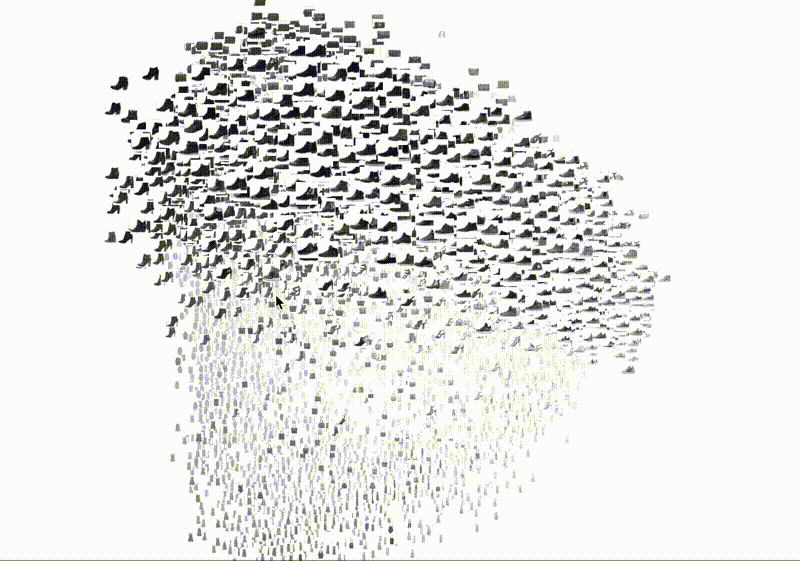

# imports

In [1]:
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
import numpy as np 
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn import ensemble
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import warnings
warnings.filterwarnings('ignore')
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from numpy import nan
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import StackingClassifier
from numba import jit, cuda
scores=dict()

In [2]:
#importing the data as csv
fminsttrain= pd.read_csv(r'C:\Users\avida\Downloads\archive (7)\fashion-mnist_train.csv')
test= pd.read_csv(r'C:\Users\avida\Downloads\archive (7)\fashion-mnist_test.csv')

# cleaning the data

In [3]:
#checking the size of the data
fminsttrain.shape

(60000, 785)

In [4]:
#cheking if there null in the data
fminsttrain.isnull().any().sum()

0

In [5]:
fminsttrain['label']

0        2
1        9
2        6
3        0
4        3
        ..
59995    9
59996    1
59997    8
59998    8
59999    7
Name: label, Length: 60000, dtype: int64

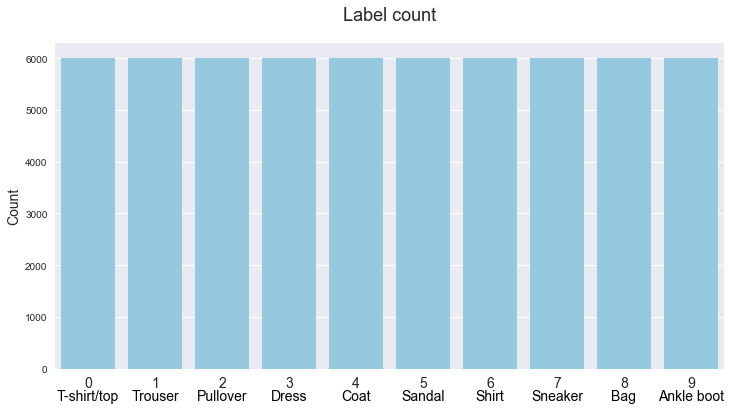

In [6]:
# Number of images in each class
dictionary = {
    0 :'T-shirt/top',
    1 : 'Trouser',
    2 : 'Pullover',
    3 : 'Dress',
    4 : 'Coat',
    5 : 'Sandal',
    6 : 'Shirt',
    7 : 'Sneaker',
    8 : 'Bag',
    9 : 'Ankle boot'
}
class_names = list(dictionary.values())
plt.style.use('seaborn')
fig, ax = plt.subplots(1,1, figsize = (12,6))
sns.countplot(x='label', data = fminsttrain, ax = ax, color = 'skyblue')

for i, counter in zip(ax.patches, range(0,10)):
        ax.text(x = i.get_x() + i.get_width()/2, y = -600,
                s = f"{class_names[counter]}",
                ha = 'center', size = 14, rotation = 0, color = 'black')

ax.set_title('Label count', fontsize = 18, y = 1.05)
ax.set_xticklabels(list(range(0,10)), fontsize = 14)
ax.set_xlabel(None)
ax.set_ylabel('Count', fontsize = 14);

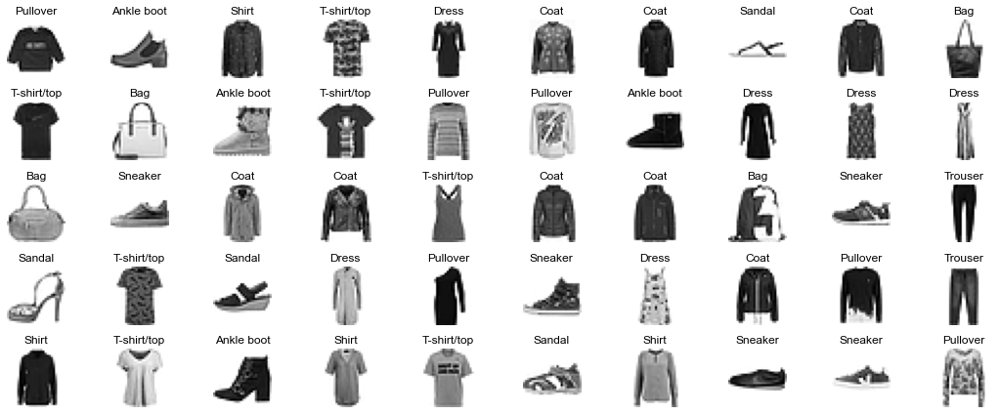

In [7]:
# Code for visualizing images in the dataset
# It is always important to frequently visualize and validate the data before training the model
train_x = fminsttrain.iloc[:, 1:].values
train_y = fminsttrain.label.values

plt.figure(figsize=(15, 6))
n_rows = 5
n_cols = 10

for i in range(n_rows * n_cols):
    ax = plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(train_x[i].reshape(28, 28), cmap='binary')
    plt.axis('off')
    plt.title(class_names[train_y[i]], fontdict={'fontsize': 12, 'color': 'black'})
    
plt.tight_layout()
plt.show()

# setting the vectors x,y

In [8]:
#set the y vector(train)
y_train = fminsttrain['label']
y_train

0        2
1        9
2        6
3        0
4        3
        ..
59995    9
59996    1
59997    8
59998    8
59999    7
Name: label, Length: 60000, dtype: int64

In [9]:
#set the y vector(test)
y_test = test['label']
y_test

0       0
1       1
2       2
3       2
4       3
       ..
9995    0
9996    6
9997    8
9998    8
9999    1
Name: label, Length: 10000, dtype: int64

In [10]:
#set the x vector
X_train= fminsttrain.drop(['label'],axis = 1)
X_train

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,5,0,0,...,0,0,0,30,43,0,0,0,0,0
3,0,0,0,1,2,0,0,0,0,0,...,3,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59996,0,0,0,0,0,0,0,0,0,0,...,73,0,0,0,0,0,0,0,0,0
59997,0,0,0,0,0,0,0,0,0,0,...,160,162,163,135,94,0,0,0,0,0
59998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [11]:
#set the x vector
X_test= test.drop(['label'],axis = 1)
X_test

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0,0,0,0,0,0,0,9,8,0,...,103,87,56,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,34,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,14,53,99,17,...,0,0,0,0,63,53,31,0,0,0
3,0,0,0,0,0,0,0,0,0,161,...,137,126,140,0,133,224,222,56,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0,0,0,0,0,0,0,0,0,37,...,32,23,14,20,0,0,1,0,0,0
9996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,2,52,23,28,0,0,0
9997,0,0,0,0,0,0,0,0,0,0,...,175,172,172,182,199,222,42,0,1,0
9998,0,1,3,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


# visualization of a sample image from the data

In [12]:
# making a function to produce an image
def plot_sample(fminsttrain, index):
    plt.figure()
    plt.imshow(fminsttrain[index].reshape(28, 28))
    plt.colorbar()
    plt.grid(False)
    plt.show()

Sample image before Scaling


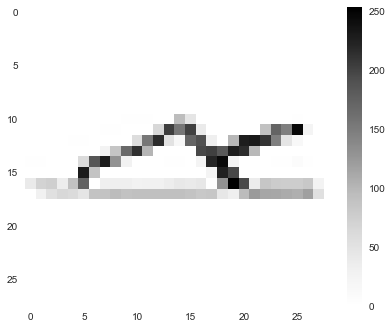

In [13]:
print("Sample image before Scaling")
plot_sample(train_x, 7)

Sample image after Scaling


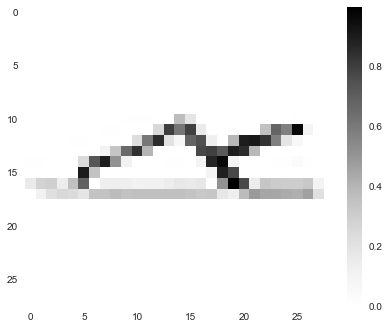

In [14]:
train_x = train_x / 255.0

print("Sample image after Scaling")
plot_sample(train_x, 7)

as we can see also after the scaling the picture has no damage so we can use scaling function.
The above figure shows a colorbar going from 0 to 255. The highest value is 255. It's always a best approach to rescale/normalize the data before feeding it to ML model.
Normalizing the data, speeds up learning and leads to faster convergence of the learning algorithm.

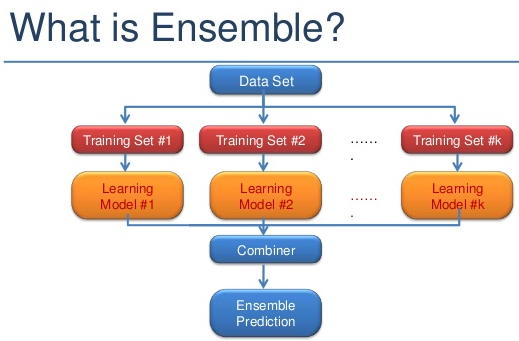

# scaling the data as the values are centered around the mean with a unit standard deviation.

Standardize features by removing the mean and scaling to unit variance

The standard score of a sample x is calculated as:

z = (x - u) / s

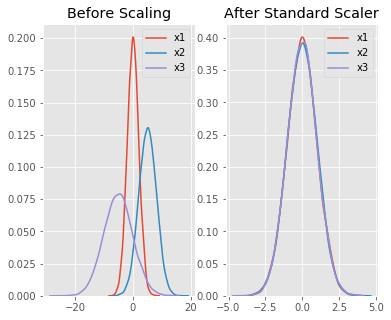

Although normalization via min-max scaling is a commonly used technique that is useful when we need values in a bounded interval,
standardization can be more practical for many machine learning algorithms. The reason is that many linear models,
such as the logistic regression and SVM,
[...] initialize the weights to 0 or small random values close to 0. Using standardization,
we center the feature columns at mean 0 with standard deviation 1 so that the feature columns take the form of a normal distribution, which makes it easier to learn the weights. Furthermore, standardization maintains useful information about outliers and makes the algorithm less sensitive to them in contrast to min-max scaling,
which scales the data to a limited range of values

In [15]:
scale = StandardScaler()
X_test = pd.DataFrame(scale.fit_transform(X_test.values), columns=X_test.columns, index=X_test.index)
X_train = pd.DataFrame(scale.fit_transform(X_train.values), columns=X_train.columns, index=X_train.index)
X_train

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,-0.009505,-0.022693,-0.028907,-0.041557,-0.057575,-0.070503,-0.098084,-0.155981,-0.238546,-0.377959,...,-0.601712,-0.476945,-0.395154,-0.406441,-0.440185,-0.396719,-0.287717,-0.158258,-0.091432,-0.033046
1,-0.009505,-0.022693,-0.028907,-0.041557,-0.057575,-0.070503,-0.098084,-0.155981,-0.238546,-0.377959,...,-0.601712,-0.476945,-0.395154,-0.406441,-0.440185,-0.396719,-0.287717,-0.158258,-0.091432,-0.033046
2,-0.009505,-0.022693,-0.028907,-0.041557,-0.057575,-0.070503,-0.098084,0.198798,-0.238546,-0.377959,...,-0.601712,-0.476945,-0.395154,0.275910,0.389449,-0.396719,-0.287717,-0.158258,-0.091432,-0.033046
3,-0.009505,-0.022693,-0.028907,0.366132,0.406799,-0.070503,-0.098084,-0.155981,-0.238546,-0.377959,...,-0.549579,-0.476945,-0.395154,-0.406441,-0.440185,-0.374570,-0.287717,-0.158258,-0.091432,-0.033046
4,-0.009505,-0.022693,-0.028907,-0.041557,-0.057575,-0.070503,-0.098084,-0.155981,-0.238546,-0.377959,...,-0.601712,-0.476945,-0.395154,-0.406441,-0.440185,-0.396719,-0.287717,-0.158258,-0.091432,-0.033046
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,-0.009505,-0.022693,-0.028907,-0.041557,-0.057575,-0.070503,-0.098084,-0.155981,-0.238546,-0.377959,...,-0.601712,-0.476945,-0.395154,-0.406441,-0.440185,-0.396719,-0.287717,-0.158258,-0.091432,-0.033046
59996,-0.009505,-0.022693,-0.028907,-0.041557,-0.057575,-0.070503,-0.098084,-0.155981,-0.238546,-0.377959,...,0.666865,-0.476945,-0.395154,-0.406441,-0.440185,-0.396719,-0.287717,-0.158258,-0.091432,-0.033046
59997,-0.009505,-0.022693,-0.028907,-0.041557,-0.057575,-0.070503,-0.098084,-0.155981,-0.238546,-0.377959,...,2.178732,2.839056,3.487716,2.664137,1.373435,-0.396719,-0.287717,-0.158258,-0.091432,-0.033046
59998,-0.009505,-0.022693,-0.028907,-0.041557,-0.057575,-0.070503,-0.098084,-0.155981,-0.238546,-0.377959,...,-0.601712,-0.476945,-0.395154,-0.406441,-0.440185,-0.396719,-0.287717,-0.158258,-0.091432,-0.033046


## define the parameters to  training the model 

In [16]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# ensemble 

Supervised learning algorithms perform the task of searching through a hypothesis space to find a suitable hypothesis that will make good predictions with a particular problem.
Ensembles combine multiple hypotheses to form a better hypothesis. The term ensemble is usually reserved for methods that generate multiple hypotheses using the same base learner.

# PCA

The principal components of a collection of points in a real coordinate space are a sequence of p unit vectors,
where the i-th vector is the direction of a line that best fits the data while being orthogonal to the first i-1 vectors.
Here
,a best-fitting line is defined as one that minimizes the average squared distance from the points to the line.
These directions constitute an orthonormal basis in which different individual dimensions of the data are linearly uncorrelated.
Principal component analysis (PCA) is the process of computing the principal components and using them to perform a change of basis on the data,
sometimes using only the first few principal components and ignoring the rest.

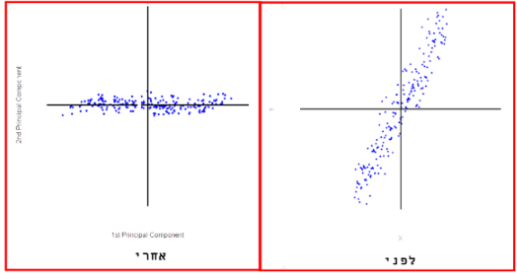

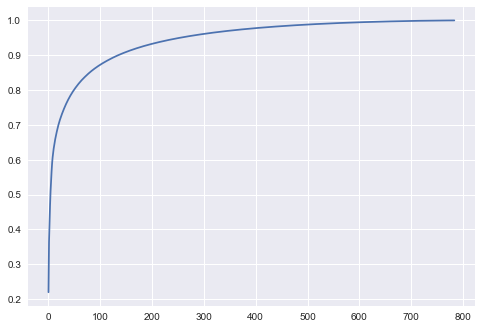

In [17]:
#checking how much components we can remove from the data without making a big reduce to the accuracy
pca = PCA()
pca.fit(X_train)
cumsum = np.cumsum(pca.explained_variance_ratio_)
plt.plot(cumsum)

In [18]:
#we saw that the elbow is long so we can remove 734! features and still get a high accuracy,lets try
pca = PCA(n_components=0.8)
train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_val)
print("numer of attributes after PCA: ",pca.n_components_,"\nnumber of attributes before PCA: ",len(list(X_train.columns)))

numer of attributes after PCA:  50 
number of attributes before PCA:  784


50


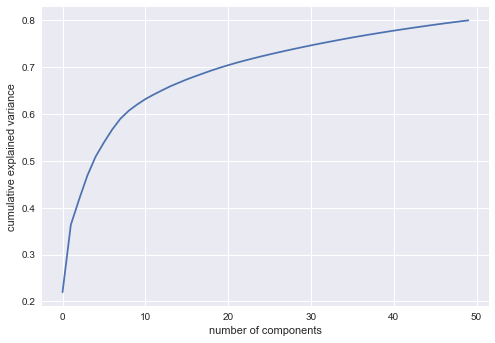

In [19]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
print(pca.n_components_)

In [20]:
# set the vector X (train\test) with the new features
X_train_PCA1 = pd.DataFrame(train_pca)
X_test_PCA1 = pd.DataFrame(X_test_pca)

# DummyClassifier

1.Most Frequent: The classifier always predicts the most frequent class label in the training data.

2.Stratified: It generates predictions by respecting the class distribution of the training data. It is different from the “most frequent” strategy as it instead associates a probability with each data point of being the most frequent class label.

3.Uniform: It generates predictions uniformly at random.

[0.1, 0.0982, 0.104]


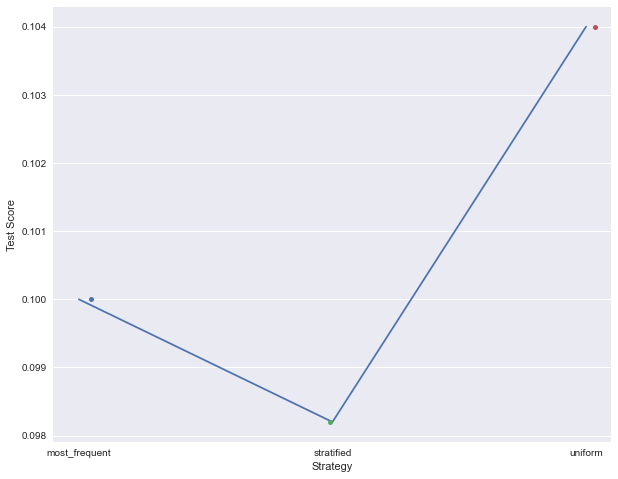

In [38]:
strategies = ['most_frequent','stratified', 'uniform'] 
test_scores = [] 
for s in strategies: 
    if s == 'most_frequent':
        dclf = DummyClassifier(strategy = s, random_state = 0) 
    else:
        dclf = DummyClassifier(strategy = s, random_state = 0) 
    dclf.fit(X_train_PCA1, y_train) 
    score = dclf.score(X_test, y_test) 
    test_scores.append(score) 
print(test_scores)
plt.figure(figsize=(10,8))
ax = sns.stripplot(strategies,test_scores)
sns.lineplot(x=strategies,y=test_scores,ax=ax)
ax.set(xlabel ='Strategy', ylabel ='Test Score') 
plt.show() 

In [21]:
def stats(model):
    y_pred=model.predict(X_test_PCA1)
    plt.figure(1, figsize= (10,10))
    c_m=confusion_matrix(y_val, y_pred, labels=None, sample_weight=None)
    print("Confusion Matrix ")
    sns.heatmap(c_m.T, square=True, annot=True, fmt='d', cbar=False)
    plt.xlabel('true label')
    plt.ylabel('predicted label')
    plt.show()
    plt.close()
    print(classification_report(y_val, y_pred,digits=4))

# Knn

the k-nearest neighbors (KNN) algorithm is a simple, easy-to-implement supervised machine learning algorithm that can be used to solve both classification and regression problems.

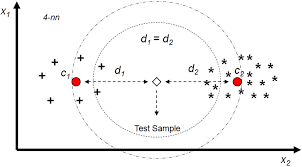

In [24]:
    knn_param_grid =     {
         'n_neighbors': list(range(3,100,10)),
         'weights':['uniform','distance'],
         'metric': ['euclidean','manhattan','minkowski'],
        }

    knn_grid_search = RandomizedSearchCV(
        KNeighborsClassifier(n_jobs=-1),
        knn_param_grid,
        cv=3,
        scoring='accuracy',
        return_train_score=True,
        random_state=0
    )
    knn_grid_search.fit(X_train_PCA1, y_train)
    
knn_grid_search.best_estimator_

KNeighborsClassifier(metric='manhattan', n_jobs=-1, n_neighbors=13)

In [25]:
knn_grid_search.best_score_

0.8521041666666666

Confusion Matrix 


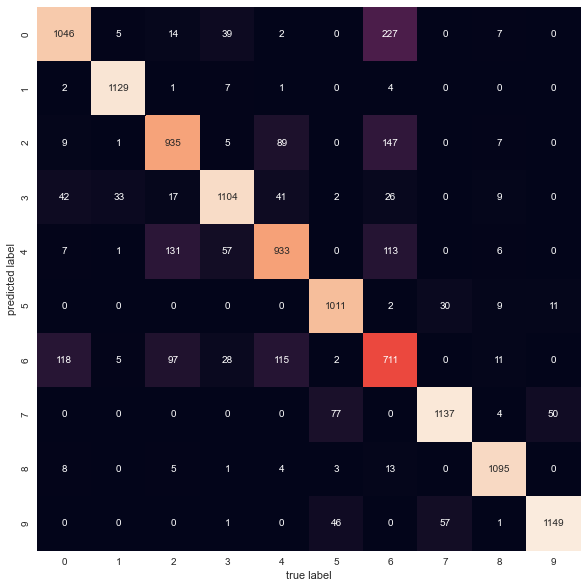

              precision    recall  f1-score   support

           0     0.7806    0.8490    0.8134      1232
           1     0.9869    0.9617    0.9741      1174
           2     0.7837    0.7792    0.7814      1200
           3     0.8666    0.8889    0.8776      1242
           4     0.7476    0.7873    0.7670      1185
           5     0.9511    0.8861    0.9174      1141
           6     0.6541    0.5720    0.6103      1243
           7     0.8967    0.9289    0.9125      1224
           8     0.9699    0.9530    0.9614      1149
           9     0.9163    0.9496    0.9326      1210

    accuracy                         0.8542     12000
   macro avg     0.8553    0.8556    0.8548     12000
weighted avg     0.8535    0.8542    0.8531     12000



In [26]:
knn = KNeighborsClassifier(metric='manhattan', n_jobs=-1, n_neighbors=13)
knn.fit(X_train_PCA1, y_train)
Y_pred = knn.predict(X_test_PCA1)

scores["knn"]=accuracy_score(y_val,Y_pred)
stats(knn)

# xgBoost

xgBoost is an algorhitm that uses a more regularized model formalization to control over-fitting, which gives it better performance to get a better accucracy.

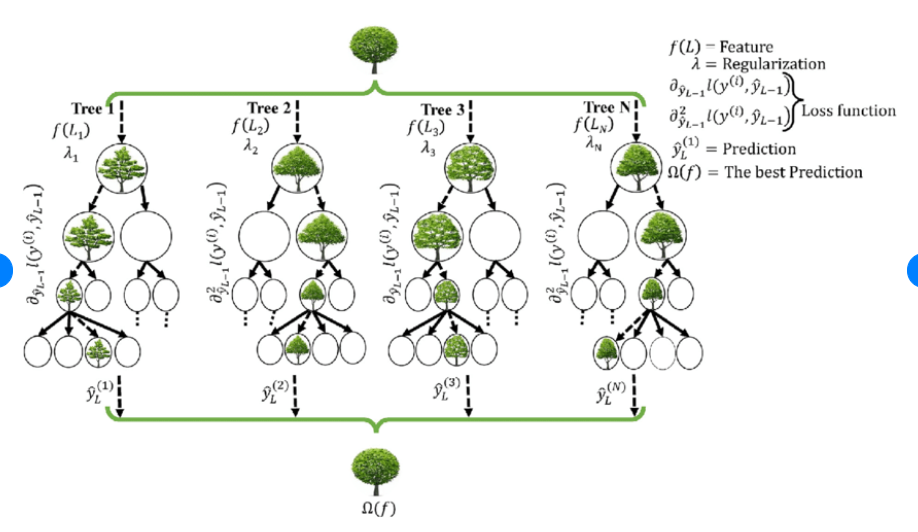

In [ ]:
#grid search to get the best paramters to this model
xgb_params = {
        'max_depth': [3,6,10],
        'learning_rate': [0.01, 0.05, 0.1],
        'n_estimators': [100, 500, 1000],
        'colsample_bytree': [0.3, 0.7]
    }

xgb_clf = XGBClassifier(
        objective='multi:softmax',
        gamma = 0,
        colsample_bytree = 0.8)

XGBGridsearch = RandomizedSearchCV(xgb_clf, xgb_params,scoring='accuracy',cv=3, random_state=0,n_jobs=-1)
XGBGridsearch.fit(X_train_PCA1, y_train)


In [ ]:
XGBGridsearch.best_estimator_

In [ ]:
XGBGridsearch.best_score_

[20:45:42] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix 


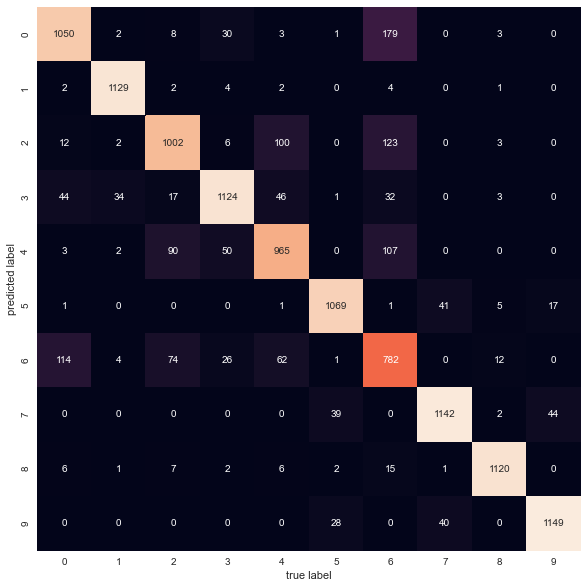

              precision    recall  f1-score   support

           0     0.8229    0.8523    0.8373      1232
           1     0.9869    0.9617    0.9741      1174
           2     0.8029    0.8350    0.8186      1200
           3     0.8640    0.9050    0.8840      1242
           4     0.7929    0.8143    0.8035      1185
           5     0.9419    0.9369    0.9394      1141
           6     0.7274    0.6291    0.6747      1243
           7     0.9307    0.9330    0.9319      1224
           8     0.9655    0.9748    0.9701      1149
           9     0.9441    0.9496    0.9468      1210

    accuracy                         0.8777     12000
   macro avg     0.8779    0.8792    0.8780     12000
weighted avg     0.8765    0.8777    0.8766     12000



In [30]:
# Build xgboost model
xgb_reg = xgboost.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
xgb_reg.fit(X_train_PCA1, y_train)
y_pred = xgb_reg.predict(X_test_PCA1)
xgb_reg_accuracy = metrics.accuracy_score(y_val, y_pred)


scores["XGBoost"]=accuracy_score(y_val,y_pred)
stats(xgb_reg)

# Random forest

It utilizes ensemble learning, which is a technique that combines many classifiers to provide solutions to complex problems.
A random forest algorithm consists of many decision trees

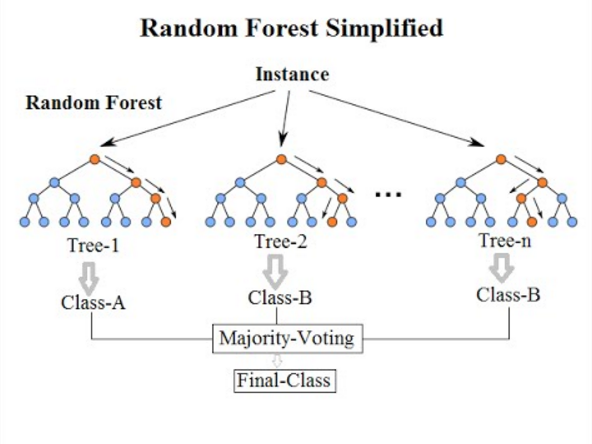

Confusion Matrix 


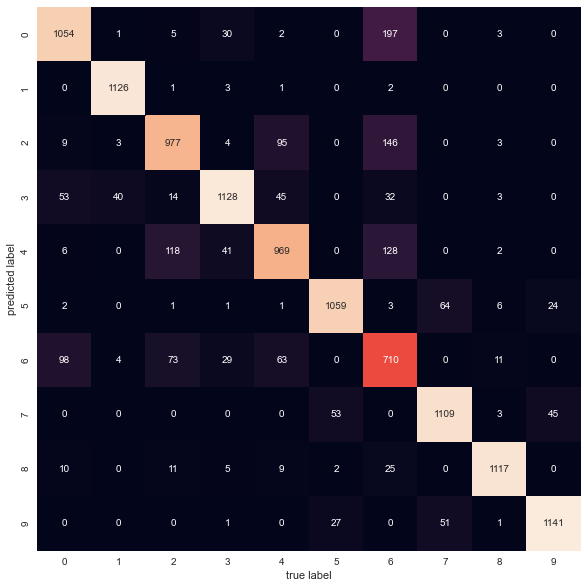

              precision    recall  f1-score   support

           0     0.8158    0.8555    0.8352      1232
           1     0.9938    0.9591    0.9762      1174
           2     0.7898    0.8142    0.8018      1200
           3     0.8578    0.9082    0.8823      1242
           4     0.7666    0.8177    0.7913      1185
           5     0.9121    0.9281    0.9201      1141
           6     0.7186    0.5712    0.6365      1243
           7     0.9165    0.9060    0.9113      1224
           8     0.9474    0.9721    0.9596      1149
           9     0.9345    0.9430    0.9387      1210

    accuracy                         0.8658     12000
   macro avg     0.8653    0.8675    0.8653     12000
weighted avg     0.8640    0.8658    0.8638     12000



In [31]:
# Build random forest model
random_forest = RandomForestClassifier(max_depth=30, max_features='sqrt', n_estimators=400,
                       n_jobs=-1, random_state=0)
random_forest.fit(X_train_PCA1, y_train)
y_pred_forest = random_forest.predict(X_test_pca)

scores["random_forest"]=accuracy_score(y_val, y_pred_forest)
stats(random_forest)

# gaussian naive bayes

the Gaussian Processes Classifier is a classification machine learning algorithm.
Gaussian Processes are a generalization of the Gaussian probability distribution and can be used as the basis for sophisticated non-parametric machine learning algorithms for classification and regression

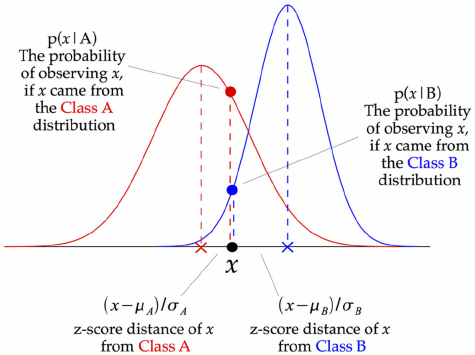

Confusion Matrix 


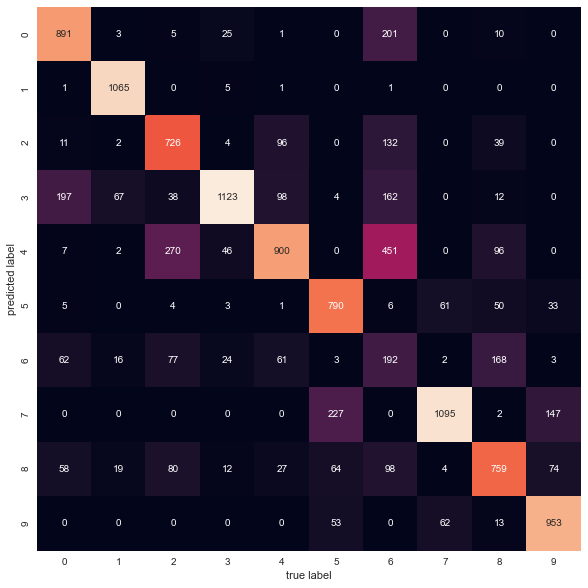

              precision    recall  f1-score   support

           0     0.7843    0.7232    0.7525      1232
           1     0.9925    0.9072    0.9479      1174
           2     0.7188    0.6050    0.6570      1200
           3     0.6602    0.9042    0.7632      1242
           4     0.5079    0.7595    0.6087      1185
           5     0.8290    0.6924    0.7545      1141
           6     0.3158    0.1545    0.2075      1243
           7     0.7444    0.8946    0.8126      1224
           8     0.6351    0.6606    0.6476      1149
           9     0.8816    0.7876    0.8320      1210

    accuracy                         0.7078     12000
   macro avg     0.7070    0.7089    0.6984     12000
weighted avg     0.7052    0.7078    0.6968     12000



In [75]:
# Build gaussian naive bayes model
gnb = GaussianNB()
gnb.fit(X_train_PCA1,y_train)
y_pred = gnb.predict(X_test_PCA1)
scores["gnb"]=accuracy_score(y_val, y_pred)
stats(gnb)

# LogisticRegression

Logistic regression is a linear algorithm (with a non-linear transform on output).
It does assume a linear relationship between the input variables with the output. Data transforms of your input variables that better expose this linear relationship can result in a more accurate model

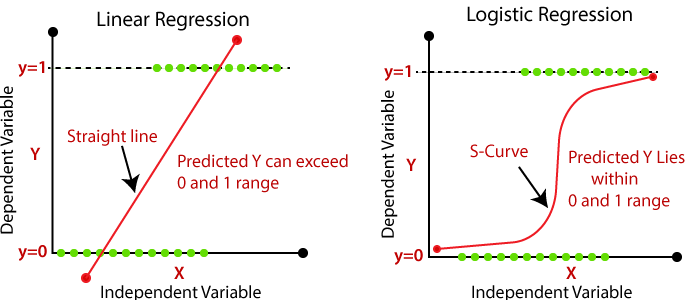

Confusion Matrix 


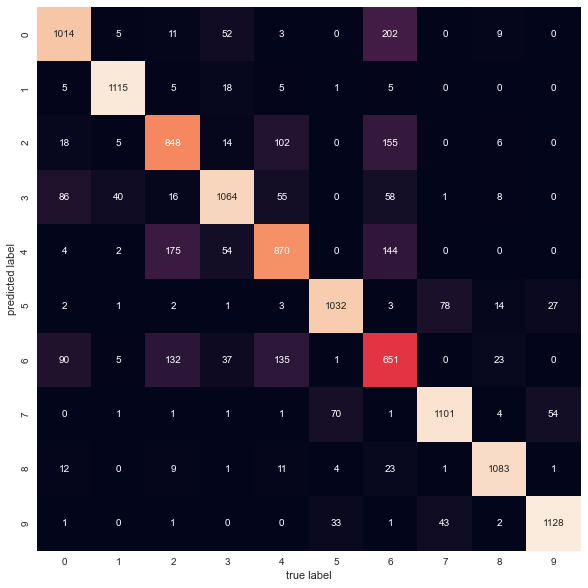

              precision    recall  f1-score   support

           0     0.7824    0.8231    0.8022      1232
           1     0.9662    0.9497    0.9579      1174
           2     0.7387    0.7067    0.7223      1200
           3     0.8012    0.8567    0.8280      1242
           4     0.6966    0.7342    0.7149      1185
           5     0.8874    0.9045    0.8958      1141
           6     0.6061    0.5237    0.5619      1243
           7     0.8922    0.8995    0.8959      1224
           8     0.9459    0.9426    0.9442      1149
           9     0.9330    0.9322    0.9326      1210

    accuracy                         0.8255     12000
   macro avg     0.8250    0.8273    0.8256     12000
weighted avg     0.8232    0.8255    0.8238     12000



In [60]:
# Build LogisticRegression model
clf_log = LogisticRegression(n_jobs = -1)
clf_log.fit(X_train_PCA1,y_train)
y_pred_logistic= clf_log.predict(X_test_PCA1)
scores["clf_log"]=accuracy_score(y_val, y_pred_logistic)
stats(clf_log)

# Voting

A Voting Classifier is a machine learning model that trains on an ensemble of numerous models and predicts an output (class) based on their highest probability of chosen class as the output.
It simply aggregates the findings of each classifier passed into Voting Classifier and predicts the output class based on the highest majority of voting.

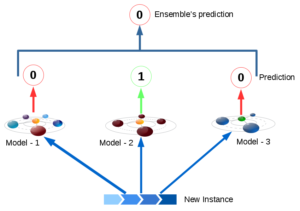

Confusion Matrix 


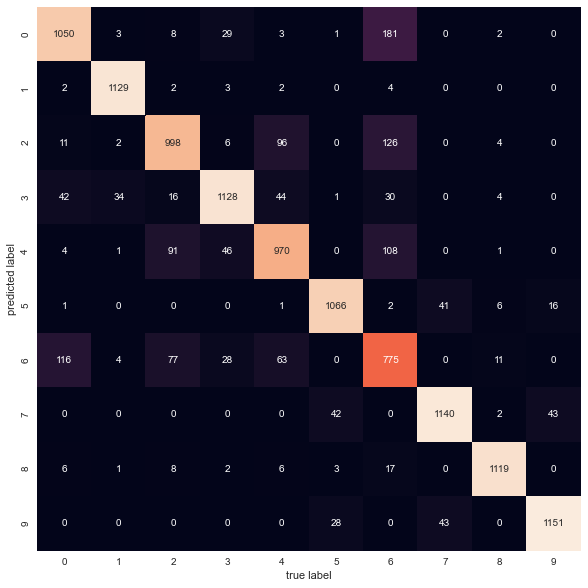

              precision    recall  f1-score   support

           0     0.8222    0.8523    0.8370      1232
           1     0.9886    0.9617    0.9750      1174
           2     0.8029    0.8317    0.8170      1200
           3     0.8684    0.9082    0.8878      1242
           4     0.7944    0.8186    0.8063      1185
           5     0.9409    0.9343    0.9376      1141
           6     0.7216    0.6235    0.6690      1243
           7     0.9291    0.9314    0.9302      1224
           8     0.9630    0.9739    0.9684      1149
           9     0.9419    0.9512    0.9465      1210

    accuracy                         0.8772     12000
   macro avg     0.8773    0.8787    0.8775     12000
weighted avg     0.8759    0.8772    0.8760     12000



In [32]:
# Build voting model
log_clf = LogisticRegression(solver="lbfgs", random_state=42)
rnd_clf = RandomForestClassifier(max_depth=30, max_features='sqrt', n_estimators=400,
                       n_jobs=-1, random_state=0)
xgb_clf = xgboost.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
knn = KNeighborsClassifier(metric='manhattan', n_jobs=-1, n_neighbors=13)
gnb = GaussianNB()

voting_clf = VotingClassifier(
    estimators=[('rf', rnd_clf),('xgb', xgb_clf),('knn_bag', BaggingClassifier(knn))],voting='soft',weights=[1,4,1],n_jobs=-1)
voting_clf.fit(X_train_PCA1,y_train)
y_pred_clf=voting_clf.predict(X_test_PCA1)
scores["voting_clf"]=accuracy_score(y_val, y_pred_clf)
stats(voting_clf)

# Stacking

stacked Generalization, or stacking for short, is an ensemble machine learning algorithm. 
Stacking involves using a machine learning model to learn how to best combine the predictions from contributing ensemble members

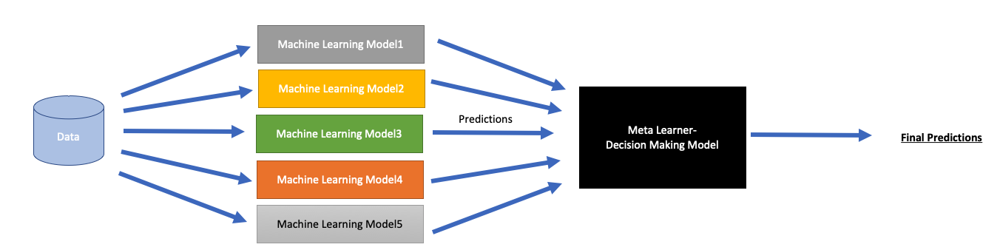

[11:56:16] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix 


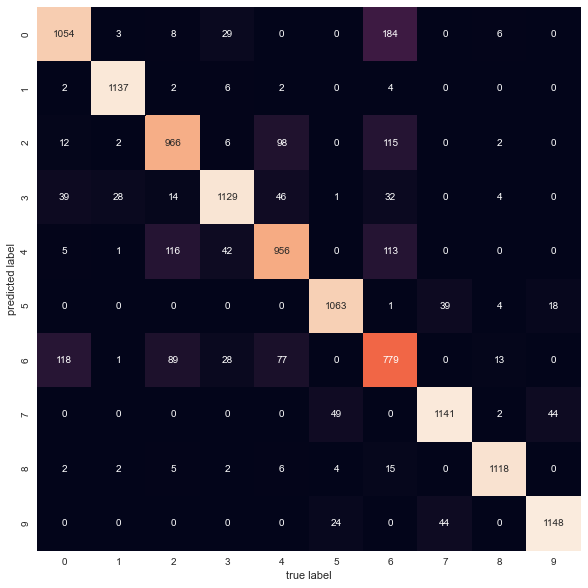

              precision    recall  f1-score   support

           0     0.8209    0.8555    0.8378      1232
           1     0.9861    0.9685    0.9772      1174
           2     0.8043    0.8050    0.8047      1200
           3     0.8732    0.9090    0.8907      1242
           4     0.7753    0.8068    0.7907      1185
           5     0.9449    0.9316    0.9382      1141
           6     0.7050    0.6267    0.6635      1243
           7     0.9231    0.9322    0.9276      1224
           8     0.9688    0.9730    0.9709      1149
           9     0.9441    0.9488    0.9464      1210

    accuracy                         0.8742     12000
   macro avg     0.8746    0.8757    0.8748     12000
weighted avg     0.8731    0.8742    0.8733     12000



In [66]:
# Build stack model
stack_model = StackingClassifier(
    estimators=[('lr', log_clf), ('rf', rnd_clf),('knn_bag', BaggingClassifier(knn))], final_estimator=xgboost.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None))
stack_model.fit(X_train_PCA1,y_train)
y_test_pred = stack_model.predict(X_test_PCA1)


scores["stack_model"]=accuracy_score(y_val, y_test_pred)
stats(stack_model)

now i will check the accuracy on data that was not exposed to the train proccess,the test data.

In [34]:
#convert the test data to the same features we have in the traun data
X_test = pca.transform(X_test)

In [77]:
#gnb
y_pred_gnb = gnb.predict(X_test)
final_gnb = accuracy_score(y_test, y_pred_gnb)*100
print(f'gnb score: {final_gnb}')

gnb score: 71.06


In [70]:
#logistic regression
y_pred_log = clf_log.predict(X_test)
final_log = accuracy_score(y_test, y_pred_log)*100
print(f'logistic regression score: {final_log}')

logistic regression score: 82.95


In [78]:
#knn 
knn_pred = knn.predict(X_test)
final_knn = accuracy_score(y_test, knn_pred)*100
print(f'knn score: {final_knn}')

knn score: 86.02


In [72]:
#random_forest
y_pred_random_forest = random_forest.predict(X_test)
final_random_forest = accuracy_score(y_test, y_pred_random_forest)*100
print(f'random_forest score: {final_random_forest}')

random_forest score: 86.42


In [74]:
#stack_model
y_stack_model = stack_model.predict(X_test)
final_stack_model = accuracy_score(y_test, y_stack_model)*100
print(f'stack_model score: {final_stack_model}')

stack_model score: 87.29


In [35]:
#voting
y_voting_clf = voting_clf.predict(X_test)
final_voting_clf = accuracy_score(y_test, y_voting_clf)*100
print(f'voting score: {final_voting_clf}')

voting score: 88.07000000000001


# conclusion

# after all the hard work, the best model is "voting model" with '88.07'% accuracy,and just 50 features(we start with 784)!!!